# Setup


In [ ]:
!pip install segmentation-models
!pip install tensorflow==2.1.0
!pip install keras==2.3.1
!pip install h5py==2.10.0
!pip install stardist

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 50 kB 4.4 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 421.8 MB 26 kB/s 
     |████████████████████████████████| 26.1 MB 1.2 MB/s 
     |████████████████████████████████| 3.8 MB 51.5 MB/s 
     |████████████████████████████████| 448 kB 74.7 MB/s 
  Created wheel for gast: filename=gast-0.2.2-py3-none-any.whl size=7554 sha256=6363d51478ac413d529bb4bf3ce93dd2835ed8cda143f496c02dd672e90e6768
  Stored in directory: /root/.cache/pip/wheels/21/7f/02/420f32a803f7d0967b48dd823da3f558c5166991bfd204eef3
Successfully built gast
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.8.0
    Uninstalling tensorflow-estimator-2.8.0:
      Successfully uninstalled tensorflow-estimator-2.8.0
  Attempting uninstall: tensor

In [ ]:
print(tf.__version__)

2.1.0


In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import segmentation_models as sm
import tensorflow as tf
import seaborn as sns
import numpy as np
import stardist
import requests
import pathlib
import cv2
import glob
import PIL
import os

Using TensorFlow backend.


Segmentation Models: using `keras` framework.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
os.getcwd()
path = '/content/drive/My Drive/CanField'
os.chdir(path)

# Organize data

In [ ]:
import shutil

In [ ]:
# Unzips file
import zipfile
with zipfile.ZipFile('data/Training_GroundTruth/original.zip', 'r') as zip_ref:
    zip_ref.extractall('data/Training_GroundTruth/')

In [ ]:
src = 'data/Training_GroundTruth/'

In [ ]:
for image in os.listdir(src):
  print(image)

lesions
lesion_pigment_network
pigment_network_temp
all_masks
pigment_network
globules
milia_like_cyst
streaks
negative_network


In [ ]:
import shutil

src = 'data/Training_GroundTruth/all_masks/'
dest = 'data/Training_GroundTruth/'
for image in os.listdir(src):
  if os.path.isfile(src + image):
    if 'streaks' in str(image):
      shutil.copy((src + image), (dest + 'streaks/'))

In [ ]:
len(os.listdir('data/Training_Input'))

2594

In [ ]:
len(os.listdir('data/Training_GroundTruth/streaks'))

2594

In [ ]:
os.listdir(dest)

['globules',
 'milia_like_cysts',
 'negative_network',
 'streaks',
 'lesions',
 'lesion_pigment_network',
 'pigment_network_temp',
 'all_masks',
 'pigment_network']

In [ ]:
# Creates directories and move the images based on their class
import shutil

src = 'data/Training_GroundTruth/'

for image in os.listdir(src):

  if os.path.isfile(src + image):
    if 'globules' in str(image):
      shutil.move((src + image), (src + 'globules'))
    elif 'milia' in str(image):
      shutil.move((src + image), (src + 'milia_like_cysts'))
    elif 'negative' in str(image):
      shutil.move((src + image), (src + 'negative_network'))
    elif 'pigment' in str(image):
      shutil.move((src + image), (src + 'pigment_network'))
    elif 'streaks' in str(image):
      shutil.move((src + image), (src + 'streaks'))

In [ ]:
# Creates a dictionary that maps each image name to its ID number
def map_id_to_file(src_dir):
  id_dict = {}

  files = (file for file in sorted(os.listdir(src_dir)) 
         if os.path.isfile(os.path.join(src_dir, file)))

  for filename in files:
    if '.png' in str(filename):
      id_dict[int(filename[5:12])] = str(filename)

  return id_dict

In [ ]:
src_train_input = 'data/Training_Input/pigment_network/'
train_input_dict = map_id_to_file(src_train_input)
print(train_input_dict)

{149: 'ISIC_0000149.jpg', 150: 'ISIC_0000150.jpg', 151: 'ISIC_0000151.jpg', 152: 'ISIC_0000152.jpg', 153: 'ISIC_0000153.jpg', 154: 'ISIC_0000154.jpg', 157: 'ISIC_0000157.jpg', 159: 'ISIC_0000159.jpg', 160: 'ISIC_0000160.jpg', 161: 'ISIC_0000161.jpg', 162: 'ISIC_0000162.jpg', 163: 'ISIC_0000163.jpg', 164: 'ISIC_0000164.jpg', 165: 'ISIC_0000165.jpg', 166: 'ISIC_0000166.jpg', 167: 'ISIC_0000167.jpg', 169: 'ISIC_0000169.jpg', 170: 'ISIC_0000170.jpg', 171: 'ISIC_0000171.jpg', 172: 'ISIC_0000172.jpg', 173: 'ISIC_0000173.jpg', 175: 'ISIC_0000175.jpg', 176: 'ISIC_0000176.jpg', 177: 'ISIC_0000177.jpg', 179: 'ISIC_0000179.jpg', 181: 'ISIC_0000181.jpg', 182: 'ISIC_0000182.jpg', 183: 'ISIC_0000183.jpg', 184: 'ISIC_0000184.jpg', 185: 'ISIC_0000185.jpg', 186: 'ISIC_0000186.jpg', 187: 'ISIC_0000187.jpg', 188: 'ISIC_0000188.jpg', 189: 'ISIC_0000189.jpg', 190: 'ISIC_0000190.jpg', 191: 'ISIC_0000191.jpg', 192: 'ISIC_0000192.jpg', 193: 'ISIC_0000193.jpg', 196: 'ISIC_0000196.jpg', 197: 'ISIC_0000197.jpg',

In [ ]:
os.listdir('data/Training_GroundTruth')

['original.zip',
 'globules',
 'milia_like_cysts',
 'negative_network',
 'pigment_network',
 'streaks',
 'lesions',
 'lesion_pigment_network',
 'pigment_network_temp',
 'all_masks']

In [ ]:
src_ground_truth = 'data/Training_GroundTruth/all_masks'

groundtruth_dicts = []

id_dict = map_id_to_file(str(src_ground_truth + 'globules'))
groundtruth_dicts.append(id_dict)

for folder in sorted(os.listdir(src_ground_truth)[2:]):
  id_dict = map_id_to_file(str(src_ground_truth + folder))
  groundtruth_dicts.append(id_dict)

print(groundtruth_dicts)

[{150: 'ISIC_0000150_attribute_globules.png', 151: 'ISIC_0000151_attribute_globules.png', 152: 'ISIC_0000152_attribute_globules.png', 153: 'ISIC_0000153_attribute_globules.png', 154: 'ISIC_0000154_attribute_globules.png', 155: 'ISIC_0000155_attribute_globules.png', 157: 'ISIC_0000157_attribute_globules.png', 159: 'ISIC_0000159_attribute_globules.png', 160: 'ISIC_0000160_attribute_globules.png', 161: 'ISIC_0000161_attribute_globules.png', 162: 'ISIC_0000162_attribute_globules.png', 163: 'ISIC_0000163_attribute_globules.png', 164: 'ISIC_0000164_attribute_globules.png', 165: 'ISIC_0000165_attribute_globules.png', 166: 'ISIC_0000166_attribute_globules.png', 167: 'ISIC_0000167_attribute_globules.png', 169: 'ISIC_0000169_attribute_globules.png', 170: 'ISIC_0000170_attribute_globules.png', 171: 'ISIC_0000171_attribute_globules.png', 172: 'ISIC_0000172_attribute_globules.png', 173: 'ISIC_0000173_attribute_globules.png', 175: 'ISIC_0000175_attribute_globules.png', 176: 'ISIC_0000176_attribute_g

In [ ]:
for id in groundtruth_dicts[0]:
  if id in train_input_dict:
    shutil.copy(str(src_train_input + train_input_dict[id]),
                src_train_input + 'globules')

In [ ]:
for id in groundtruth_dicts[1]:
  if id in train_input_dict:
    shutil.copy(str(src_train_input + train_input_dict[id]),
                src_train_input + 'milia_like_cysts')

In [ ]:
for id in groundtruth_dicts[2]:
  if id in train_input_dict:
    shutil.copy(str(src_train_input + train_input_dict[id]),
                src_train_input + 'negative_network')

In [ ]:
for id in groundtruth_dicts[3]:
  if id in train_input_dict:
    shutil.copy(str(src_train_input + train_input_dict[id]),
                src_train_input + 'pigment_network')

In [ ]:
for id in groundtruth_dicts[4]:
  if id in train_input_dict:
    shutil.copy(str(src_train_input + train_input_dict[id]),
                src_train_input + 'streaks')

In [ ]:
print(sorted(os.listdir('data/Training_Input/globules')))

['ISIC_0000150.jpg', 'ISIC_0000151.jpg', 'ISIC_0000152.jpg', 'ISIC_0000153.jpg', 'ISIC_0000154.jpg', 'ISIC_0000155.jpg', 'ISIC_0000157.jpg', 'ISIC_0000159.jpg', 'ISIC_0000160.jpg', 'ISIC_0000161.jpg', 'ISIC_0000162.jpg', 'ISIC_0000163.jpg', 'ISIC_0000164.jpg', 'ISIC_0000165.jpg', 'ISIC_0000166.jpg', 'ISIC_0000167.jpg', 'ISIC_0000169.jpg', 'ISIC_0000170.jpg', 'ISIC_0000171.jpg', 'ISIC_0000172.jpg', 'ISIC_0000173.jpg', 'ISIC_0000175.jpg', 'ISIC_0000176.jpg', 'ISIC_0000177.jpg', 'ISIC_0000179.jpg', 'ISIC_0000181.jpg', 'ISIC_0000182.jpg', 'ISIC_0000183.jpg', 'ISIC_0000184.jpg', 'ISIC_0000185.jpg', 'ISIC_0000186.jpg', 'ISIC_0000187.jpg', 'ISIC_0000188.jpg', 'ISIC_0000189.jpg', 'ISIC_0000190.jpg', 'ISIC_0000191.jpg', 'ISIC_0000192.jpg', 'ISIC_0000193.jpg', 'ISIC_0000196.jpg', 'ISIC_0000197.jpg', 'ISIC_0000198.jpg', 'ISIC_0000199.jpg', 'ISIC_0000200.jpg', 'ISIC_0000201.jpg', 'ISIC_0000202.jpg', 'ISIC_0000203.jpg', 'ISIC_0000204.jpg', 'ISIC_0000205.jpg', 'ISIC_0000206.jpg', 'ISIC_0000207.jpg',

In [ ]:
print(sorted(os.listdir('data/Training_GroundTruth/lesions/globules')))

['ISIC_0000150_segmentation.png', 'ISIC_0000151_segmentation.png', 'ISIC_0000152_segmentation.png', 'ISIC_0000153_segmentation.png', 'ISIC_0000154_segmentation.png', 'ISIC_0000155_segmentation.png', 'ISIC_0000157_segmentation.png', 'ISIC_0000159_segmentation.png', 'ISIC_0000160_segmentation.png', 'ISIC_0000161_segmentation.png', 'ISIC_0000162_segmentation.png', 'ISIC_0000163_segmentation.png', 'ISIC_0000164_segmentation.png', 'ISIC_0000165_segmentation.png', 'ISIC_0000166_segmentation.png', 'ISIC_0000167_segmentation.png', 'ISIC_0000169_segmentation.png', 'ISIC_0000170_segmentation.png', 'ISIC_0000171_segmentation.png', 'ISIC_0000172_segmentation.png', 'ISIC_0000173_segmentation.png', 'ISIC_0000175_segmentation.png', 'ISIC_0000176_segmentation.png', 'ISIC_0000177_segmentation.png', 'ISIC_0000179_segmentation.png', 'ISIC_0000181_segmentation.png', 'ISIC_0000182_segmentation.png', 'ISIC_0000183_segmentation.png', 'ISIC_0000184_segmentation.png', 'ISIC_0000185_segmentation.png', 'ISIC_000

In [ ]:
print(sorted(os.listdir('data/Training_GroundTruth/globules')))

['ISIC_0000150_attribute_globules.png', 'ISIC_0000151_attribute_globules.png', 'ISIC_0000152_attribute_globules.png', 'ISIC_0000153_attribute_globules.png', 'ISIC_0000154_attribute_globules.png', 'ISIC_0000155_attribute_globules.png', 'ISIC_0000157_attribute_globules.png', 'ISIC_0000159_attribute_globules.png', 'ISIC_0000160_attribute_globules.png', 'ISIC_0000161_attribute_globules.png', 'ISIC_0000162_attribute_globules.png', 'ISIC_0000163_attribute_globules.png', 'ISIC_0000164_attribute_globules.png', 'ISIC_0000165_attribute_globules.png', 'ISIC_0000166_attribute_globules.png', 'ISIC_0000167_attribute_globules.png', 'ISIC_0000169_attribute_globules.png', 'ISIC_0000170_attribute_globules.png', 'ISIC_0000171_attribute_globules.png', 'ISIC_0000172_attribute_globules.png', 'ISIC_0000173_attribute_globules.png', 'ISIC_0000175_attribute_globules.png', 'ISIC_0000176_attribute_globules.png', 'ISIC_0000177_attribute_globules.png', 'ISIC_0000179_attribute_globules.png', 'ISIC_0000181_attribute_

# Sort categories by occurring frequency

## Demo

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import PIL
import cv2

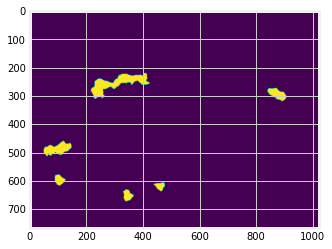

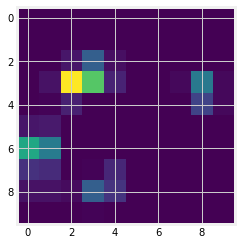

In [ ]:
src = 'data/Training_GroundTruth/'
img = PIL.Image.open(src + 'globules/ISIC_0011105_attribute_globules.png')
plt.imshow(img)
plt.show()

img = img.resize((10,10))
plt.imshow(img)
plt.show()

Resizing, although makes the code faster, might not be a good idea as there's information loss

In [ ]:
width, height = img.size
img = img.convert('L')
# iterate through each pixel in the image and count the number of white pixels
for x in range(width):
    for y in range(height):
        rgb = img.getpixel((x, y))
        print(rgb, end = " ")

0 0 0 0 0 6 59 14 5 0 0 0 0 5 1 7 41 12 5 0 0 0 6 99 9 0 0 0 3 0 0 0 30 73 0 0 0 1 30 1 0 0 4 10 0 0 0 11 15 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 40 20 0 0 0 0 0 0 0 0 2 2 0 0 0 0 0 

## Application

In [ ]:
# Given an image path, converts the image to single channel black and white
# and return the number of white pixels
def count_bw_pixels(img_path):

  img = PIL.Image.open(img_path)
  width, height = img.size
  img = img.convert('L')
  white_count = 0

  for x in range(width):
      for y in range(height):
          pixel_value = img.getpixel((x, y))
          if pixel_value >= 200:
            white_count += 1

  return white_count

In [ ]:
src = 'data/Validation_GroundTruth/'
class_dir = {'globules': src + 'globules/', 
             'milia_like_cysts' : src + 'milia_like_cysts/',
             'negative_network' : src + 'negative_network/',
             'pigment_network' : src + 'pigment_network/',
             'streaks' : src + 'streaks/'}

In [ ]:
class_dir.keys()

dict_keys(['globules', 'milia_like_cysts', 'negative_network', 'pigment_network', 'streaks'])

In [ ]:
white_count = 0
avg_white_count = 0

for dir in class_dir.values():
  for file in os.listdir(str(dir)):
    white_count += count_bw_pixels(str(dir + file))    
  
  avg_white_count = white_count/len(os.listdir(dir))
  white_count = 0
  print("Average white pixel count for", dir, " ", avg_white_count)

  

Average white pixel count for  data/Validation_GroundTruth/globules/   16830.3
Average white pixel count for  data/Validation_GroundTruth/milia_like_cysts/   6396.92
Average white pixel count for  data/Validation_GroundTruth/negative_network/   16596.7
Average white pixel count for  data/Validation_GroundTruth/pigment_network/   247496.49
Average white pixel count for  data/Validation_GroundTruth/streaks/   2673.23


# Jaccard code

In [ ]:
#define Jaccard Similarity function
def jaccard(list1, list2):
    intersection = len(list(set(list1).intersection(list2)))
    union = (len(list1) + len(list2)) - intersection
    return float(intersection) / union

In [ ]:
from keras import backend as K
def jaccard_distance(y_true, y_pred, smooth=100):
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    sum_ = K.sum(K.abs(y_true) + K.abs(y_pred), axis=-1)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return (1 - jac) * smooth

In [ ]:
a = [[1,2,3],[4,5,6]]
b = [[1,2,3],[4,5,6]]

a = np.array([1,1,1])
b = np.array([0,0,0])



print(jaccard(b,a))

0.0


# Stardist

In [ ]:
x_train = np.load('X_train_grayscale.npy')
y_train = np.load('Y_train_milia_like_cysts.npy')
y_train = np.reshape(y_train, (2594, 224, 224))

x_val = np.load('X_val_grayscale.npy')
y_val = np.load('Y_val_milia_like_cysts.npy')
y_val = np.reshape(y_val, (100, 224, 224))

In [ ]:
from stardist import fill_label_holes, random_label_cmap
from stardist.models import Config2D, StarDist2D, StarDistData2D

In [ ]:
print(Config2D.__doc__)

In [ ]:
conf = Config2D(axes='YXC', backbone='unet', grid=(2, 2), n_channel_in=1, n_channel_out=33, n_dim=2, n_rays=32, 
                net_conv_after_unet=128, net_input_shape=(None, None, 1), net_mask_shape=(None, None, 1), train_background_reg=0.0001, 
                train_batch_size=1, train_checkpoint='weights_best.h5', train_checkpoint_epoch='weights_now.h5', train_checkpoint_last='weights_last.h5',
                train_completion_crop=32, train_dist_loss='mae', train_epochs=400, train_foreground_only=0.9, train_learning_rate=0.0000003, 
                train_loss_weights=(1, 0.2), train_n_val_patches=1, train_patch_size=(224, 224), train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0},
                train_shape_completion=False, train_steps_per_epoch=100, train_tensorboard=True, unet_activation='relu', unet_batch_norm=False, 
                unet_dropout=0.1, unet_kernel_size=(3, 3), unet_last_activation='relu', unet_n_conv_per_depth=4, unet_n_depth=3, unet_n_filter_base=32, 
                unet_pool=(2, 2), unet_prefix='', use_gpu=False)

In [ ]:
conf = Config2D(axes='YXC', backbone='unet', grid=(2, 2), n_channel_in=1, n_channel_out=33, n_dim=2, n_rays=32, net_conv_after_unet=128, net_input_shape=(None, None, 1), net_mask_shape=(None, None, 1), train_background_reg=0.0001, train_batch_size=10, train_checkpoint='weights_best.h5', train_checkpoint_epoch='weights_now.h5', train_checkpoint_last='weights_last.h5', train_completion_crop=32, train_dist_loss='mae', train_epochs=400, train_foreground_only=0.9, train_learning_rate=0.00003, train_loss_weights=(1, 0.2), train_n_val_patches=None, train_patch_size=(112, 112), train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, train_shape_completion=False, train_steps_per_epoch=100, train_tensorboard=True, unet_activation='relu', unet_batch_norm=False, unet_dropout=0.1, unet_kernel_size=(3, 3), unet_last_activation='relu', unet_n_conv_per_depth=2, unet_n_depth=3, unet_n_filter_base=32, unet_pool=(2, 2), unet_prefix='', use_gpu=False)

In [ ]:
model = stardist.models.StarDist2D(conf, name="test_6")

base_model.py (149): output path for model already exists, files may be overwritten: /content/drive/MyDrive/CanField/test_6


Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.250296, nms_thresh=0.3.


In [ ]:
median_size = stardist.calculate_extents(list(y_train), np.median)
fov = np.array(model._axes_tile_overlap('YX'))
print("Median object size: ", median_size)
print("Network fov: ", fov)

Median object size:  [35. 26.]
Network fov:  [93 92]


In [ ]:
model.train(x_train, y_train, validation_data=(x_val, y_val),
            epochs = 50)

Train for 100 steps, validate on 1 samples
Epoch 1/50
100/100 [==============================] - 6s 65ms/step - loss: 0.9508 - prob_loss: 0.7291 - dist_loss: 1.1083 - prob_kld: 0.7282 - dist_relevant_mae: 1.1083 - dist_relevant_mse: 7.5020 - dist_dist_iou_metric: 8.8558e-04 - val_loss: 0.6875 - val_prob_loss: 0.6875 - val_dist_loss: 1.3688e-05 - val_prob_kld: 0.6875 - val_dist_relevant_mae: 0.0000e+00 - val_dist_relevant_mse: 0.0000e+00 - val_dist_dist_iou_metric: 0.0000e+00
Epoch 2/50
100/100 [==============================] - 3s 26ms/step - loss: 0.9307 - prob_loss: 0.7105 - dist_loss: 1.1008 - prob_kld: 0.7087 - dist_relevant_mae: 1.1008 - dist_relevant_mse: 7.8779 - dist_dist_iou_metric: 7.3899e-04 - val_loss: 0.6791 - val_prob_loss: 0.6791 - val_dist_loss: 1.4276e-05 - val_prob_kld: 0.6791 - val_dist_relevant_mae: 0.0000e+00 - val_dist_relevant_mse: 0.0000e+00 - val_dist_dist_iou_metric: 0.0000e+00
Epoch 3/50
100/100 [==============================] - 3s 26ms/step - loss: 0.9143 -

In [ ]:
model.optimize_thresholds(x_val, y_val)

NMS threshold = 0.5:  80%|████████  | 16/20 [00:18<00:04,  1.13s/it, 0.250 -> 0.000]


Using optimized values: prob_thresh=0.250296, nms_thresh=0.3.
Saving to 'thresholds.json'.


{'prob': 0.25029622512456184, 'nms': 0.3}

In [ ]:
def normalize_pred(pred):
  for i in range(len(pred)):
    for j in range(len(pred[i])):
      for k in range(len(pred[i][j])):
        if pred[i][j][k] != 0:
          pred[i][j][k] = 255

In [ ]:
predictions = [model.predict_instances(x, n_tiles=model._guess_n_tiles(x), show_tile_progress=False)[0]
              for x in x_val]

normalize_pred(predictions)

In [ ]:
np.save("val_milia_like_cysts_predictions", predictions)

In [ ]:
predictions = np.array(predictions)
print(predictions.shape)

In [ ]:
import sklearn.metrics

jaccard_list = []
jaccard_avg = 0

for i in range(len(predictions)):
  jaccard_avg = []

  for j in range(len(predictions[i])):

    jaccard_score = sklearn.metrics.jaccard_score((y_train[i][j]), (predictions[i][j]), pos_label=255, zero_division=0)

    if jaccard_score != 0:

      jaccard_avg.append(jaccard_score)
  if len(jaccard_avg) != 0:
    jaccard_avg = sum(jaccard_avg)/len(jaccard_avg)
    jaccard_list.append(jaccard_avg)

print(jaccard_list)
print(np.average(jaccard_list))

[0.14285714285714285]
0.14285714285714285


In [ ]:
print(len(jaccard_list))

1


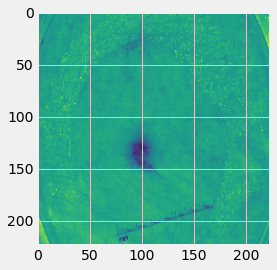

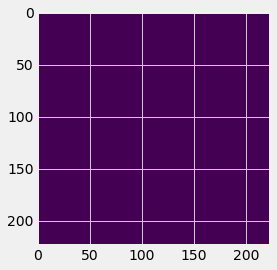

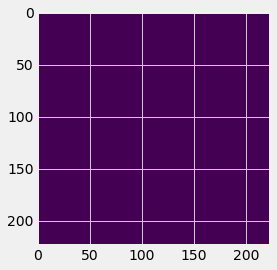

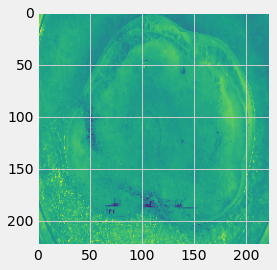

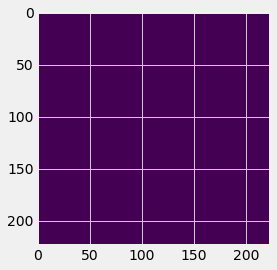

...

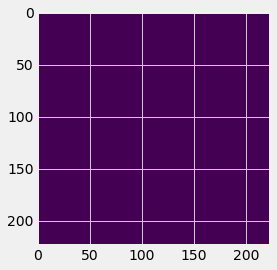

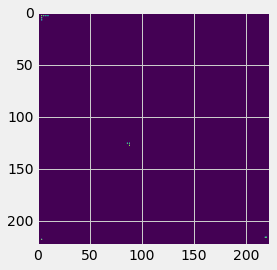

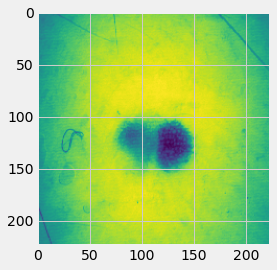

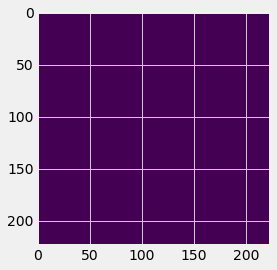

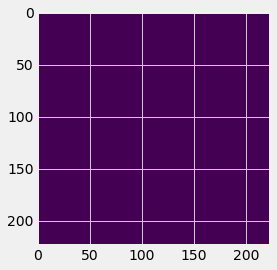

In [ ]:
for i in range(0, 30):
  plt.imshow(x_val[i])
  plt.show()
  plt.imshow(np.squeeze(y_val[i]))
  plt.show()
  plt.imshow(np.squeeze(predictions[i]))
  plt.show()

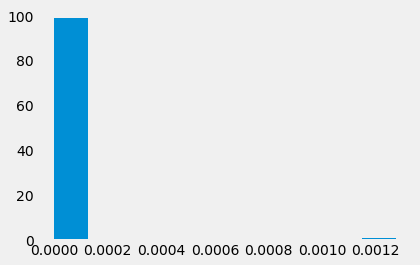

In [ ]:
plt.hist(jaccard_list)
plt.grid(False)
plt.show()

In [ ]:
count = 0

for i in predictions:
  for j in i:
    for k in j:
      if k != 0:
        count += 1

In [ ]:
print(count)

17193


In [ ]:
a = [0,0,0,0,255,255,255,0]
b = [0,0,0,0,0,0,0,0]

print(sklearn.metrics.jaccard_score(a, b, pos_label=255, zero_division=0))

0.0


In [ ]:
model.train(x_train, y_train, validation_data=(x_test, y_test),
            epochs = 200)

Epoch 1/200
200/200 [==============================] - 11s 36ms/step - loss: 1.7327 - prob_loss: 0.1578 - dist_loss: 7.8744 - prob_kld: 0.1342 - dist_relevant_mae: 7.8742 - dist_relevant_mse: 281.0194 - dist_dist_iou_metric: 0.0158 - val_loss: 1.7164 - val_prob_loss: 0.1917 - val_dist_loss: 7.6235 - val_prob_kld: 0.1713 - val_dist_relevant_mae: 7.6233 - val_dist_relevant_mse: 96.9845 - val_dist_dist_iou_metric: 0.0206 - lr: 3.0000e-05
Epoch 2/200
200/200 [==============================] - 6s 29ms/step - loss: 1.3581 - prob_loss: 0.1010 - dist_loss: 6.2858 - prob_kld: 0.0806 - dist_relevant_mae: 6.2851 - dist_relevant_mse: 194.0360 - dist_dist_iou_metric: 0.0932 - val_loss: 1.4747 - val_prob_loss: 0.2081 - val_dist_loss: 6.3330 - val_prob_kld: 0.1877 - val_dist_relevant_mae: 6.3326 - val_dist_relevant_mse: 74.1765 - val_dist_dist_iou_metric: 0.0894 - lr: 3.0000e-05
Epoch 3/200
200/200 [==============================] - 6s 29ms/step - loss: 1.2406 - prob_loss: 0.0813 - dist_loss: 5.7963 

conf = Config2D(axes='YXC', backbone='unet', grid=(2, 2), n_channel_in=1, n_channel_out=33, 
                n_dim=2, n_rays=32, net_conv_after_unet=128, net_input_shape=(None, None, 1), 
                net_mask_shape=(None, None, 1), train_background_reg=0.0001, train_batch_size=1, 
                train_checkpoint='weights_best.h5', train_checkpoint_epoch='weights_now.h5', 
                train_checkpoint_last='weights_last.h5', train_completion_crop=32, train_dist_loss='mae', 
                train_epochs=400, train_foreground_only=0.9, train_learning_rate=0.00003, train_loss_weights=(1, 0.2), 
                train_n_val_patches=1, train_patch_size=(224, 224), train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, 
                train_shape_completion=False, train_steps_per_epoch=200, train_tensorboard=True, unet_activation='relu', unet_batch_norm=False, 
                unet_dropout=0.2, unet_kernel_size=(3, 3), unet_last_activation='relu', unet_n_conv_per_depth=4, unet_n_depth=3, unet_n_filter_base=32, 
                unet_pool=(2, 2), unet_prefix='', use_gpu=False)

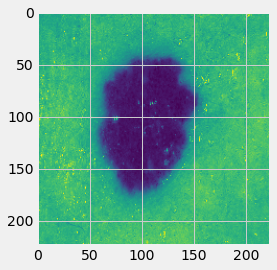

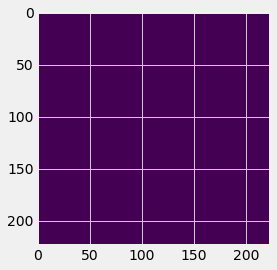

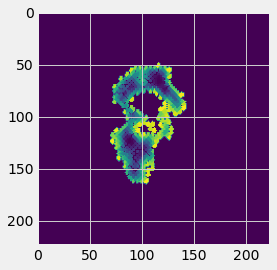

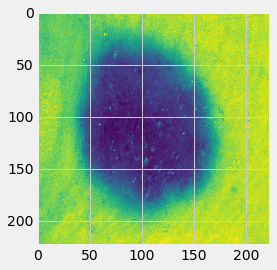

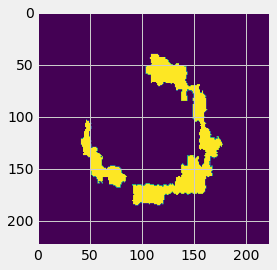

...

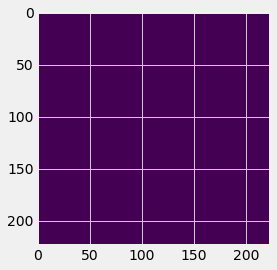

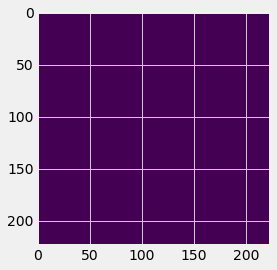

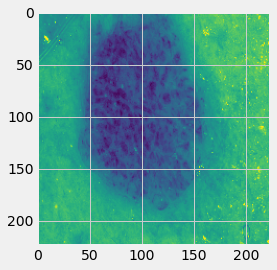

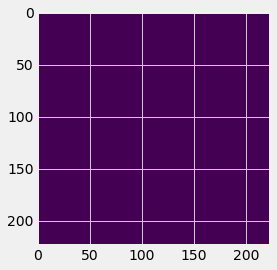

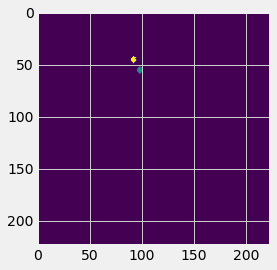

In [ ]:
for i in range(20):
  plt.imshow(x_test[i])
  plt.show()
  plt.imshow(np.squeeze(y_test[i]))
  plt.show()
  plt.imshow(np.squeeze(predictions[i]))
  plt.show()

conf = Config2D(axes='YXC', backbone='unet', grid=(2, 2), n_channel_in=1, n_channel_out=33, 
                n_dim=2, n_rays=32, net_conv_after_unet=128, net_input_shape=(None, None, 1), 
                net_mask_shape=(None, None, 1), train_background_reg=0.0001, train_batch_size=10, 
                train_checkpoint='weights_best.h5', train_checkpoint_epoch='weights_now.h5', 
                train_checkpoint_last='weights_last.h5', train_completion_crop=32, train_dist_loss='mae', 
                train_epochs=400, train_foreground_only=0.9, train_learning_rate=0.00003, train_loss_weights=(1, 0.2), 
                train_n_val_patches=None, train_patch_size=(128, 128), train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, 
                train_shape_completion=False, train_steps_per_epoch=200, train_tensorboard=True, unet_activation='relu', unet_batch_norm=False, 
                unet_dropout=0.2, unet_kernel_size=(3, 3), unet_last_activation='relu', unet_n_conv_per_depth=4, unet_n_depth=3, unet_n_filter_base=32, 
                unet_pool=(2, 2), unet_prefix='', use_gpu=False)

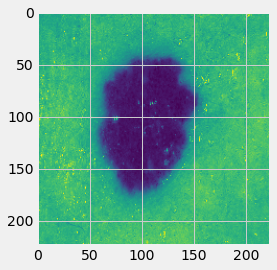

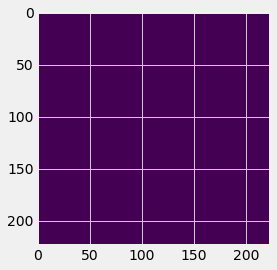

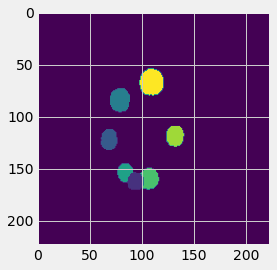

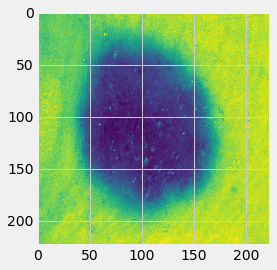

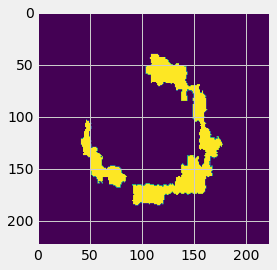

...

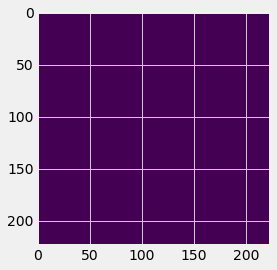

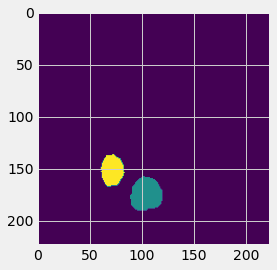

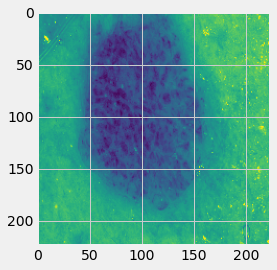

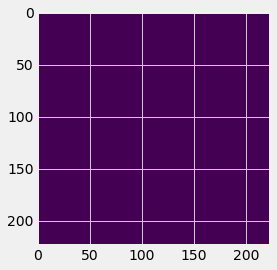

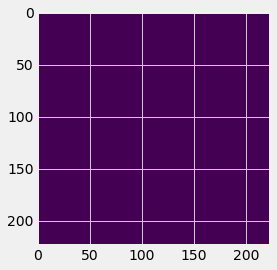

In [ ]:
for i in range(20):
  plt.imshow(x_test[i])
  plt.show()
  plt.imshow(np.squeeze(y_test[i]))
  plt.show()
  plt.imshow(np.squeeze(predictions[i]))
  plt.show()

conf = Config2D(axes='YXC', backbone='unet', grid=(2, 2), n_channel_in=1, n_channel_out=33, 
                n_dim=2, n_rays=32, net_conv_after_unet=128, net_input_shape=(None, None, 1), 
                net_mask_shape=(None, None, 1), train_background_reg=0.0001, train_batch_size=10, 
                train_checkpoint='weights_best.h5', train_checkpoint_epoch='weights_now.h5', 
                train_checkpoint_last='weights_last.h5', train_completion_crop=32, train_dist_loss='mae', 
                train_epochs=400, train_foreground_only=0.9, train_learning_rate=0.00003, train_loss_weights=(1, 0.2), 
                train_n_val_patches=None, train_patch_size=(112, 112), train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, 
                train_shape_completion=False, train_steps_per_epoch=100, train_tensorboard=True, unet_activation='relu', unet_batch_norm=False, 
                unet_dropout=0.1, unet_kernel_size=(3, 3), unet_last_activation='relu', unet_n_conv_per_depth=2, unet_n_depth=3, unet_n_filter_base=32, 
                unet_pool=(2, 2), unet_prefix='', use_gpu=False)

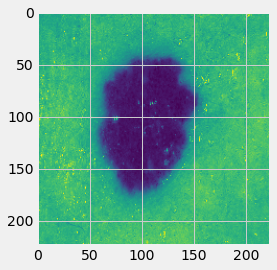

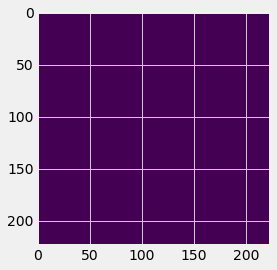

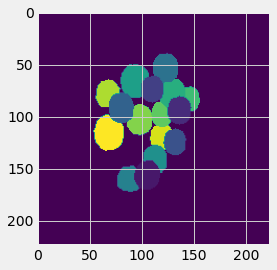

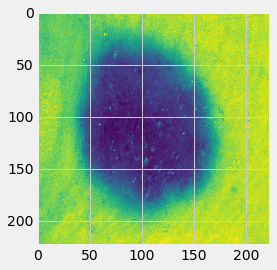

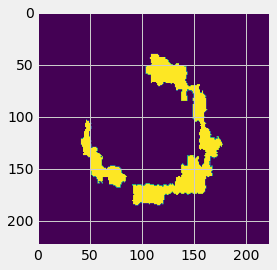

...

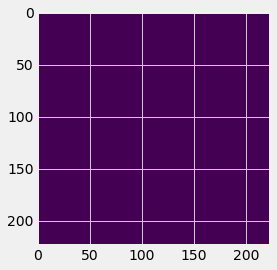

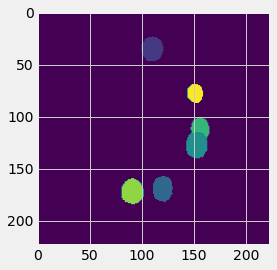

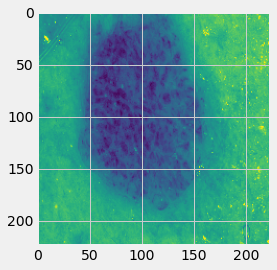

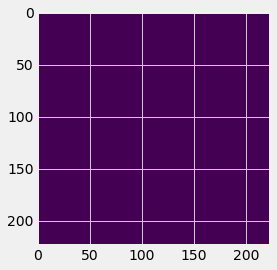

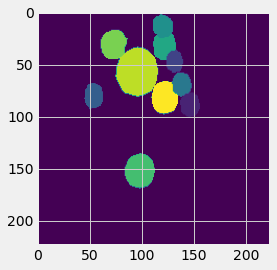

In [ ]:
for i in range(20):
  plt.imshow(x_test[i])
  plt.show()
  plt.imshow(np.squeeze(y_test[i]))
  plt.show()
  plt.imshow(np.squeeze(predictions[i]))
  plt.show()

# Semantic Segmentation

In [ ]:
BACKBONE = 'resnet34'
preprocess_input = sm.get_preprocessing(BACKBONE)

In [ ]:
#Sets image parameters
batch_size = 30
img_height = 224
img_width = 224
IMG_WIDTH_HEIGHT = 224

## Loading and splitting data

In [ ]:
input_dir = 'data/Training_Input/'
target_dir = 'data/Training_GroundTruth/streaks'

# input_img_paths = sorted(
#     [
#         os.path.join(input_dir, fname)
#         for fname in os.listdir(input_dir)
#         #if fname.endswith(".jpg")
#     ]
# )
target_img_paths = sorted(
    [
        os.path.join(target_dir, fname)
        for fname in os.listdir(target_dir)
        #if fname.endswith(".png") and not fname.startswith(".")
    ]
)

In [ ]:
from keras.preprocessing.image import load_img, array_to_img, img_to_array

In [ ]:
Y = np.zeros((len(target_img_paths), IMG_WIDTH_HEIGHT, IMG_WIDTH_HEIGHT, 1), dtype=np.uint8)
for i in range(len(target_img_paths)):

    mask_path = target_img_paths[i]
    mask = load_img(mask_path, color_mode = 'grayscale',target_size=(IMG_WIDTH_HEIGHT, IMG_WIDTH_HEIGHT))
    mask = img_to_array(mask).astype("float32")
    Y[i] = mask

In [ ]:
X = np.zeros((len(input_img_paths), IMG_WIDTH_HEIGHT, IMG_WIDTH_HEIGHT, 3), dtype=np.float32)
Y = np.zeros((len(input_img_paths), IMG_WIDTH_HEIGHT, IMG_WIDTH_HEIGHT, 1), dtype=np.uint8)
for i in range(len(target_img_paths)):

    img_path = input_img_paths[i]
    img = load_img(img_path, color_mode='rgb',target_size=(IMG_WIDTH_HEIGHT, IMG_WIDTH_HEIGHT)) #imread(img_path)[:,:,:3] #.astype("float32") #/ 255.0 -> is done by rgb2gray
    img = img_to_array(img)
    X[i] = img.astype('float32')

    mask_path = target_img_paths[i]
    mask = load_img(mask_path, color_mode = 'grayscale',target_size=(IMG_WIDTH_HEIGHT, IMG_WIDTH_HEIGHT))
    mask = img_to_array(mask).astype("float32")
    Y[i] = mask

In [ ]:
#np.save('X_val_pigment_network', X)
np.save('Y_train_streaks', Y)

In [ ]:
X = np.load('X_val_globules.npy')
Y = np.load('Y_val_globules.npy')

In [ ]:
print(X.shape)

(100, 224, 224, 3)


In [ ]:
X_gray = []
for i in X:
  img = cv2.cvtColor(i,cv2.COLOR_BGR2GRAY)
  X_gray.append(img)

In [ ]:
Y_gray = np.array(Y_gray)
print(Y_gray.shape)

(2594, 224, 224)


In [ ]:
np.save('X_val_grayscale_pigment_network', X_gray)

In [ ]:
print(X_gray)

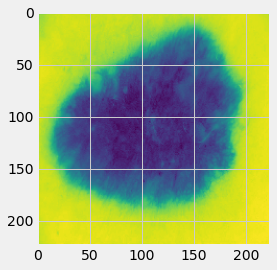

In [ ]:
plt.imshow(np.squeeze(X_gray[0]))

In [ ]:
Y = np.load('Y_multiclass.npy')

In [ ]:
train_test_split = int(len(input_img_paths)*0.9)
x_train = X[:train_test_split]
y_train = Y[:train_test_split]
x_test = X[train_test_split:]
y_test = Y[train_test_split:]

217


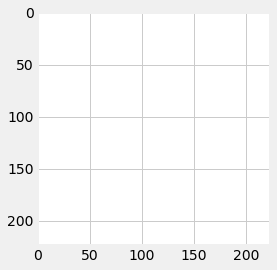

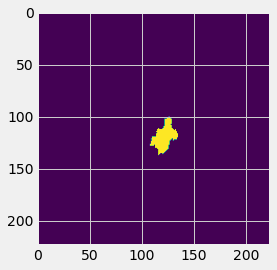

In [ ]:
import random
i = random.randint(0, len(x_test))
print(i)
plt.imshow(x_test[i])
plt.show()
plt.imshow(np.squeeze(y_test[i]))
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


352


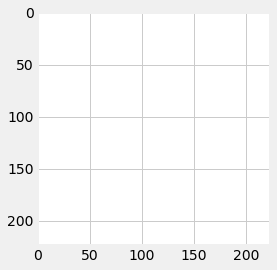

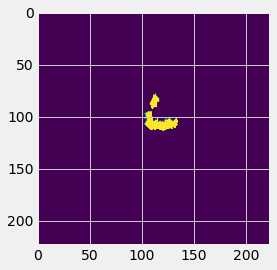

In [ ]:
import random
i = random.randint(0, len(x_train))
print(i)
plt.imshow(x_train[i])
plt.show()
plt.imshow(np.squeeze(y_train[i]))
plt.show()

In [ ]:
y_train = tf.cast(y_train, tf.float32)
y_test = tf.cast(y_test, tf.float32)

In [ ]:
x_train = preprocess_input(x_train)
x_test = preprocess_input(x_test)
y_train = preprocess_input(y_train)
y_test = preprocess_input(y_test)

## Loads data for multiclass model

### Demo

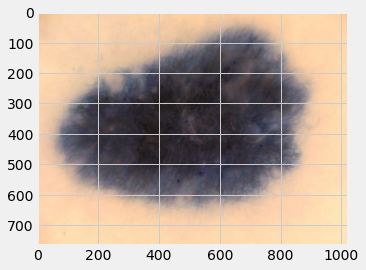

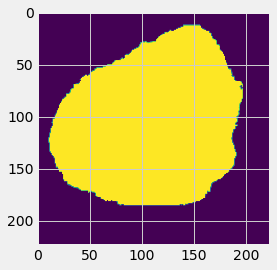

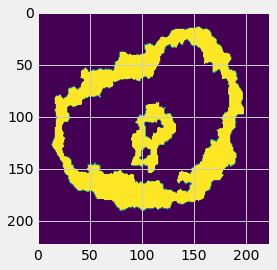

In [ ]:
# Load image as array
import cv2

input_dir = 'data/Training_Input/'
pigment_dir = 'data/Training_GroundTruth/pigment_network/'
lesion_dir = 'data/Training_GroundTruth/lesions/'

input = cv2.imread(input_dir + sorted(os.listdir(input_dir))[0])
plt.imshow(input)
plt.show()

lesion = cv2.imread(lesion_dir + sorted(os.listdir(lesion_dir))[0], 0)
lesion = cv2.resize(lesion, (224, 224))
plt.imshow(lesion)
plt.show()

pigment = cv2.imread(pigment_dir + sorted(os.listdir(pigment_dir))[0], 0)
pigment = cv2.resize(pigment, (224, 224))
plt.imshow(pigment)
plt.show()

In [ ]:
print(np.array(lesion).shape)
print(np.array(pigment).shape)

(224, 224)
(224, 224)


In [ ]:
def merge_masks_into_rgb(list_of_masks):
  
  output = np.zeros((224, 224, 3))
  mask_count = 0


  for mask in list_of_masks:
      for height in range(len(mask)): 
        for pixel in range(len(mask[height])):
          if mask[height][pixel] == 1 or mask[height][pixel] == 255:
              output[height][pixel][mask_count] = 255
      mask_count += 1

  return output

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


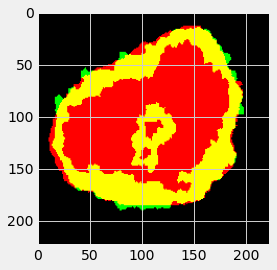

In [ ]:
output = merge_masks_into_rgb([lesion, pigment])
plt.imshow(output)

In [ ]:
cv2.imwrite('data/test.png', output)

True

### Merging all images

In [ ]:
pigment_dir = 'data/Training_GroundTruth/pigment_network/'
lesion_dir = 'data/Training_GroundTruth/lesions/'
output_dir = 'data/Training_GroundTruth/lesion_pigment_network/'

In [ ]:
for i in range(len(os.listdir(pigment_dir))):
  lesion = cv2.imread(lesion_dir + sorted(os.listdir(lesion_dir))[i], 0)
  lesion = cv2.resize(lesion, (224, 224))

  pigment = cv2.imread(pigment_dir + sorted(os.listdir(pigment_dir))[i], 0)
  pigment = cv2.resize(pigment, (224, 224))

  output = merge_masks_into_rgb([lesion, pigment])
  cv2.imwrite((output_dir + 'ISIC_' + str(i) + '_lesion_pigment.png'), output)

In [ ]:
print(os.listdir(output_dir))

[]


### Load and split data


In [ ]:
input_dir = 'data/Training_Input/'
target_dir = 'data/Training_GroundTruth/lesion_pigment_network/'

In [ ]:
# Create arrays with image paths 
input_img_paths = sorted(
    [
        os.path.join(input_dir, fname)
        for fname in os.listdir(input_dir)
        #if fname.endswith(".jpg")
    ]
)
target_img_paths = (
    [
        os.path.join(target_dir, fname)
        for fname in os.listdir(target_dir)
        #if fname.endswith(".png") and not fname.startswith(".")
    ]
)

In [ ]:
print(input_img_paths)
print(target_img_paths)

['data/Training_Input/pigment_network/ISIC_0000149.jpg', 'data/Training_Input/pigment_network/ISIC_0000150.jpg', 'data/Training_Input/pigment_network/ISIC_0000151.jpg', 'data/Training_Input/pigment_network/ISIC_0000152.jpg', 'data/Training_Input/pigment_network/ISIC_0000153.jpg', 'data/Training_Input/pigment_network/ISIC_0000154.jpg', 'data/Training_Input/pigment_network/ISIC_0000157.jpg', 'data/Training_Input/pigment_network/ISIC_0000159.jpg', 'data/Training_Input/pigment_network/ISIC_0000160.jpg', 'data/Training_Input/pigment_network/ISIC_0000161.jpg', 'data/Training_Input/pigment_network/ISIC_0000162.jpg', 'data/Training_Input/pigment_network/ISIC_0000163.jpg', 'data/Training_Input/pigment_network/ISIC_0000164.jpg', 'data/Training_Input/pigment_network/ISIC_0000165.jpg', 'data/Training_Input/pigment_network/ISIC_0000166.jpg', 'data/Training_Input/pigment_network/ISIC_0000167.jpg', 'data/Training_Input/pigment_network/ISIC_0000169.jpg', 'data/Training_Input/pigment_network/ISIC_00001

In [ ]:
# Preprocess the arrays with specificc parameters
from keras.preprocessing.image import load_img, array_to_img, img_to_array

X = np.zeros((len(input_img_paths), IMG_WIDTH_HEIGHT, IMG_WIDTH_HEIGHT, 3), dtype=np.float32)
Y = np.zeros((len(input_img_paths), IMG_WIDTH_HEIGHT, IMG_WIDTH_HEIGHT, 3), dtype=np.uint8)
for i in range(len(target_img_paths)):
    img_path = input_img_paths[i]
    img = load_img(img_path, color_mode='rgb',target_size=(IMG_WIDTH_HEIGHT, IMG_WIDTH_HEIGHT)) #imread(img_path)[:,:,:3] #.astype("float32") #/ 255.0 -> is done by rgb2gray
    img = img_to_array(img)
    X[i] = img.astype('float32') / 255.0
    
    mask_path = target_img_paths[i]
    mask = load_img(mask_path, color_mode = 'rgb',target_size=(IMG_WIDTH_HEIGHT, IMG_WIDTH_HEIGHT))
    mask = img_to_array(mask).astype("float32") / 255.0
    Y[i] = mask

In [ ]:
np.save('X_multiclass', X)
np.save('Y_multiclass', Y)

In [ ]:
print(Y)

[[[[0 0 0]
   [0 0 0]
   [0 0 0]
   ...
   [0 0 0]
   [0 0 0]
   [0 0 0]]

  [[0 0 0]
   [0 0 0]
   [0 0 0]
   ...
   [0 0 0]
   [0 0 0]
   [0 0 0]]

  [[0 0 0]
   [0 0 0]
   [0 0 0]
   ...
   [0 0 0]
   [0 0 0]
   [0 0 0]]

  ...

  [[0 0 0]
   [0 0 0]
   [0 0 0]
   ...
   [0 0 0]
   [0 0 0]
   [0 0 0]]

  [[0 0 0]
   [0 0 0]
   [0 0 0]
   ...
   [0 0 0]
   [0 0 0]
   [0 0 0]]

  [[0 0 0]
   [0 0 0]
   [0 0 0]
   ...
   [0 0 0]
   [0 0 0]
   [0 0 0]]]


 [[[0 0 0]
   [0 0 0]
   [0 0 0]
   ...
   [0 0 0]
   [0 0 0]
   [0 0 0]]

  [[0 0 0]
   [0 0 0]
   [0 0 0]
   ...
   [0 0 0]
   [0 0 0]
   [0 0 0]]

  [[0 0 0]
   [0 0 0]
   [0 0 0]
   ...
   [0 0 0]
   [0 0 0]
   [0 0 0]]

  ...

  [[0 0 0]
   [0 0 0]
   [0 0 0]
   ...
   [0 0 0]
   [0 0 0]
   [0 0 0]]

  [[0 0 0]
   [0 0 0]
   [0 0 0]
   ...
   [0 0 0]
   [0 0 0]
   [0 0 0]]

  [[0 0 0]
   [0 0 0]
   [0 0 0]
   ...
   [0 0 0]
   [0 0 0]
   [0 0 0]]]


 [[[0 0 0]
   [0 0 0]
   [0 0 0]
   ...
   [0 0 0]
   [0 0 0]
   [0 0 0]]

  [[0 0

In [ ]:
# Splits into train and test
train_test_split = int(len(input_img_paths)*0.9)
x_train = X[:train_test_split]
y_train = Y[:train_test_split]
x_test = X[train_test_split:]
y_test = Y[train_test_split:]

172


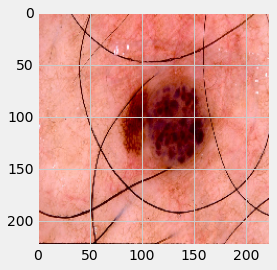

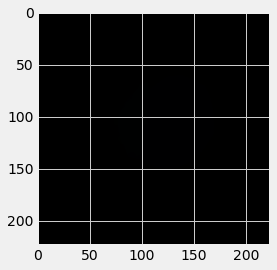

In [ ]:
# Displays random image with its mask
import random
i = random.randint(0, len(x_train))
print(i)
plt.imshow(x_train[i])
plt.show()
plt.imshow(np.squeeze(y_train[i]))
plt.show()

In [ ]:
# Changes train and test datatypes for training
y_train = tf.cast(y_train, tf.float32)
y_test = tf.cast(y_test, tf.float32)

In [ ]:
# Preprocess train and test
x_train = preprocess_input(x_train)
x_test = preprocess_input(x_test)
y_train = preprocess_input(y_train)
y_test = preprocess_input(y_test)

## Multiclass model

### Unet Model


In [ ]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda

def multi_unet_model(n_classes=3, IMG_HEIGHT=256, IMG_WIDTH=256, IMG_CHANNELS=1):

    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    #s = Lambda(lambda x: x / 255)(inputs) 
    s = inputs

    #Contraction path
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
    c1 = Dropout(0.1)(c1)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = Dropout(0.1)(c2)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
     
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
     
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = Dropout(0.2)(c4)
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)
     
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = Dropout(0.3)(c5)
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)
    
    #Expansive path 
    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = Dropout(0.2)(c6)
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
     
    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = Dropout(0.2)(c7)
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
     
    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = Dropout(0.1)(c8)
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)
     
    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = Dropout(0.1)(c9)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)
     
    outputs = Conv2D(n_classes, (1, 1), activation='softmax')(c9)
     
    model = Model(inputs=[inputs], outputs=[outputs])
    
    return model

In [ ]:
def get_model():
    return multi_unet_model(n_classes=3, IMG_HEIGHT=224, IMG_WIDTH=224, IMG_CHANNELS=3)
model = get_model()

In [ ]:
rsm= tf.keras.optimizers.RMSprop(
                            learning_rate=0.000000000000000000001,
                            rho=0.9,
                            momentum=0.0,
                            epsilon=1e-07,
                            centered=False,
                            name="RMSprop")

adam = tf.keras.optimizers.Adam(
    learning_rate=0.00000000000001,
    beta_1=0.9,
    beta_2=0.999,
    epsilon=1e-07,
    amsgrad=False,
    name='Adam'
)


adamax = tf.keras.optimizers.Adamax(
    learning_rate=0.000000000000000001,
    beta_1=0.9,
    beta_2=0.999,
    epsilon=1e-07,
    name='Adamax'
)

In [ ]:
model.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])
#model.summary()

In [ ]:
model.compile(loss=sm.losses.bce_jaccard_loss,
               optimizer = adam,
              metrics=[sm.metrics.iou_score])

In [ ]:
history = model.fit(x_train, y_train, 
                    batch_size = 10, 
                    verbose=1, 
                    epochs=50, 
                    validation_data=(x_test, y_test), 
                    #class_weight=class_weights,
                    shuffle=False)

Epoch 1/50
76/76 [==============================] - 9s 94ms/step - loss: 0.3184 - accuracy: 0.1529 - val_loss: 0.3408 - val_accuracy: 0.1596
Epoch 2/50
76/76 [==============================] - 7s 89ms/step - loss: 0.3184 - accuracy: 0.1528 - val_loss: 0.3408 - val_accuracy: 0.1596
Epoch 3/50
76/76 [==============================] - 7s 90ms/step - loss: 0.3185 - accuracy: 0.1528 - val_loss: 0.3408 - val_accuracy: 0.1596
Epoch 4/50
76/76 [==============================] - 7s 91ms/step - loss: 0.3185 - accuracy: 0.1529 - val_loss: 0.3408 - val_accuracy: 0.1596
Epoch 5/50
76/76 [==============================] - 7s 91ms/step - loss: 0.3184 - accuracy: 0.1528 - val_loss: 0.3408 - val_accuracy: 0.1596
Epoch 6/50
76/76 [==============================] - 7s 91ms/step - loss: 0.3184 - accuracy: 0.1528 - val_loss: 0.3408 - val_accuracy: 0.1596
Epoch 7/50
76/76 [==============================] - 7s 91ms/step - loss: 0.3184 - accuracy: 0.1529 - val_loss: 0.3408 - val_accuracy: 0.1596
Epoch 8/50
76

KeyboardInterrupt: ignored

In [ ]:
predictions = model.predict(x_test)

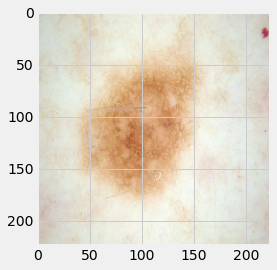

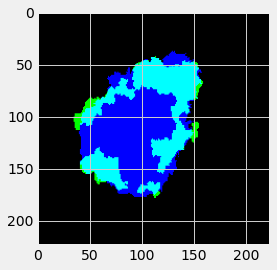

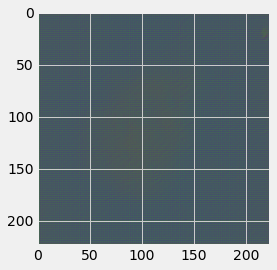

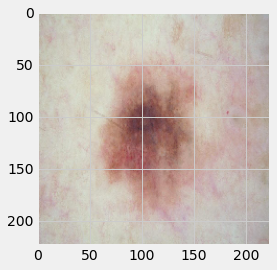

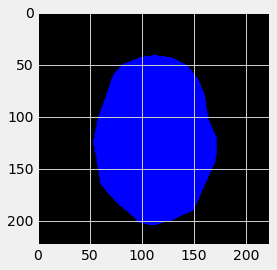

...

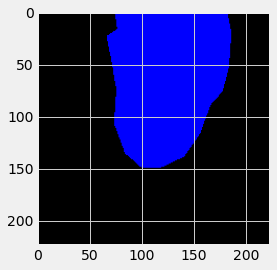

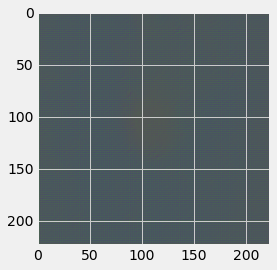

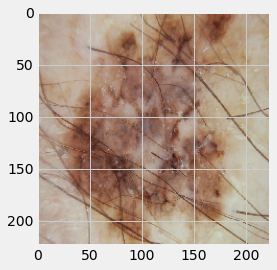

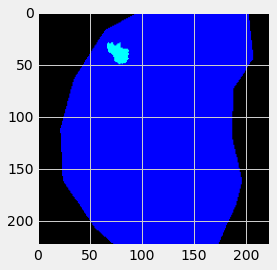

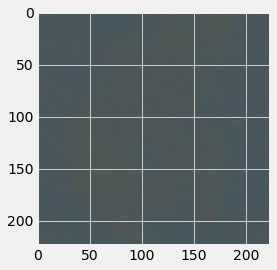

In [ ]:
for i in range(5):
  plt.imshow(x_test[i])
  plt.show()
  plt.imshow(np.squeeze(y_test[i]))
  plt.show()
  plt.imshow(np.squeeze(predictions[i]))
  plt.show()

### Segmentation library model

In [ ]:
sm.set_framework('tf.keras')
sm.framework()

'tf.keras'

In [ ]:
tf.keras.backend.clear_session()

In [ ]:
# define model
model = []
model = sm.Unet('resnet34', classes = 3)
#model.compile(optimizer='adam', loss=sm.losses.bce_jaccard_loss, metrics=[sm.metrics.iou_score])

#print(model.summary())

85532672/85521592 [==============================] - 3s 0us/step


In [ ]:
RSM = tf.keras.optimizers.RMSprop(
                            learning_rate=0.000000000001,
                            rho=0.9,
                            momentum=0.0,
                            epsilon=1e-07,
                            centered=False,
                            name="RMSprop")

#sig_crossentropy = tf.nn.sigmoid_cross_entropy_with_logits(
#    labels=y_train, logits=x_train, name="sigmoid_cross_entropy")

model.compile(loss=sm.losses.bce_jaccard_loss,
               optimizer = RSM,
              metrics=[sm.metrics.iou_score])

In [ ]:
callbacks = tf.keras.callbacks.EarlyStopping(monitor='val_iou_score', 
                                min_delta=0, 
                                patience=5, 
                                verbose=2, 
                                mode='auto', 
                                baseline=None, 
                                restore_best_weights=True)

In [ ]:
history=model.fit(x_train, 
          y_train,
          batch_size=1, 
          epochs=50,
          verbose=1,
          callbacks = callbacks,
          validation_data=(x_test, y_test))

Epoch 1/50
2334/2334 [==============================] - 111s 45ms/step - loss: 1.7408 - iou_score: 0.0713 - val_loss: 1.8563 - val_iou_score: 0.0762
Epoch 2/50
2334/2334 [==============================] - 105s 45ms/step - loss: 1.7408 - iou_score: 0.0713 - val_loss: 1.8643 - val_iou_score: 0.0762
Epoch 3/50
2225/2334 [===========================>..] - ETA: 4s - loss: 1.7414 - iou_score: 0.0711

KeyboardInterrupt: ignored

In [ ]:
model.save('Unet_resnet34.h5')

In [ ]:
#accuracy = model.evaluate(x_val, y_val)
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
model = tf.keras.models.load_model('Unet_resnet34_2.h5', compile = False)

In [ ]:
RSM = tf.keras.optimizers.RMSprop(
                            learning_rate=0.00000001,
                            rho=0.9,
                            momentum=0.0,
                            epsilon=1e-07,
                            centered=False,
                            name="RMSprop")

#sig_crossentropy = tf.nn.sigmoid_cross_entropy_with_logits(
#    labels=y_train, logits=x_train, name="sigmoid_cross_entropy")

model.compile(loss=sm.losses.bce_jaccard_loss,
               optimizer = RSM,
              metrics=[sm.metrics.iou_score])

In [ ]:
predictions = model.predict(x_test)

In [ ]:
for i in range(20):
  plt.imshow(x_test[i])
  plt.show()
  plt.imshow(np.squeeze(y_test[i]))
  plt.show()
  plt.imshow(np.squeeze(predictions[i]))
  plt.show()

## Singleton model (single class)


In [ ]:
X = np.load('X_singleton.npy')
Y = np.load('Y_multiclass.npy')

In [ ]:
# Splits into train and test
train_test_split = int(len(input_img_paths)*0.9)
x_train = X[:train_test_split]
y_train = Y[:train_test_split]
x_test = X[train_test_split:]
y_test = Y[train_test_split:]

In [ ]:
# Changes train and test datatypes for training
y_train = tf.cast(y_train, tf.float32)
y_test = tf.cast(y_test, tf.float32)

In [ ]:
# Preprocess train and test
x_train = preprocess_input(x_train)
x_test = preprocess_input(x_test)
y_train = preprocess_input(y_train)
y_test = preprocess_input(y_test)

In [ ]:
sm.set_framework('tf.keras')
sm.framework()

'tf.keras'

In [ ]:
tf.keras.backend.clear_session()

In [ ]:
# define model
model = []
model = sm.Unet(backbone_name='resnet34', classes = 3)
#model.compile(optimizer='adam', loss=sm.losses.bce_jaccard_loss, metrics=[sm.metrics.iou_score])

#print(model.summary())

In [ ]:
RSM = tf.keras.optimizers.RMSprop(
                            learning_rate=0.0000001,
                            rho=0.9,
                            momentum=0.0,
                            epsilon=1e-07,
                            centered=False,
                            name="RMSprop")

#sig_crossentropy = tf.nn.sigmoid_cross_entropy_with_logits(
#    labels=y_train, logits=x_train, name="sigmoid_cross_entropy")

model.compile(loss=sm.losses.bce_jaccard_loss,
               optimizer = RSM,
              metrics=[sm.metrics.iou_score])

In [ ]:
callbacks = tf.keras.callbacks.EarlyStopping(monitor='val_iou_score', 
                                min_delta=0, 
                                patience=5, 
                                verbose=2, 
                                mode='auto', 
                                baseline=None, 
                                restore_best_weights=True)

In [ ]:
history=model.fit(x_train, 
          y_train,
          batch_size=30, 
          epochs=50,
          verbose=1)
          #callbacks = callbacks)
          #validation_data=(x_test, y_test))

In [ ]:
model.save('Unet_resnet34.h5')

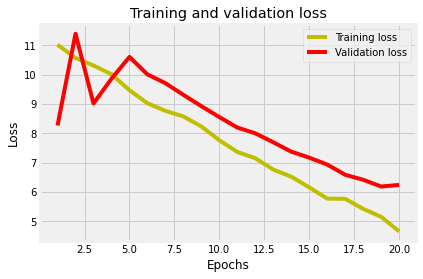

In [ ]:
#accuracy = model.evaluate(x_val, y_val)
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
model = tf.keras.models.load_model('Unet_resnet34_2.h5', compile = False)

In [ ]:
RSM = tf.keras.optimizers.RMSprop(
                            learning_rate=0.0000001,
                            rho=0.9,
                            momentum=0.0,
                            epsilon=1e-07,
                            centered=False,
                            name="RMSprop")

#sig_crossentropy = tf.nn.sigmoid_cross_entropy_with_logits(
#    labels=y_train, logits=x_train, name="sigmoid_cross_entropy")

model.compile(loss=sm.losses.bce_jaccard_loss,
               optimizer = RSM,
              metrics=[sm.metrics.iou_score])

In [ ]:
predictions = model.predict(x_test)

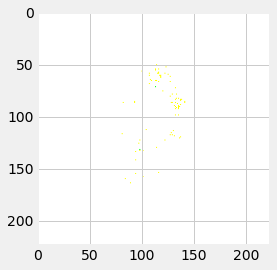

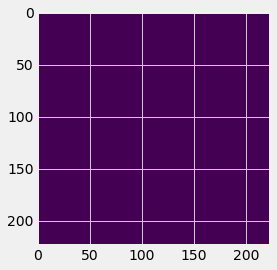

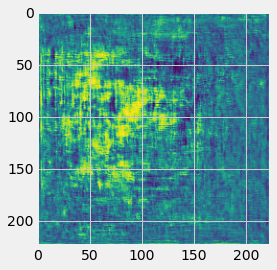

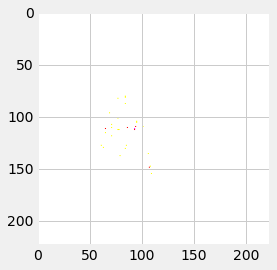

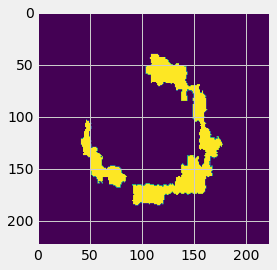

...

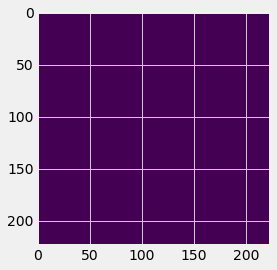

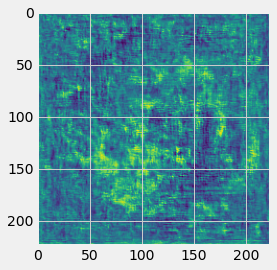

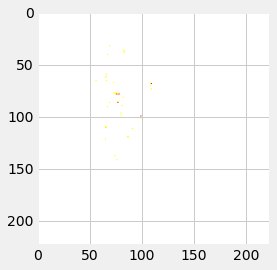

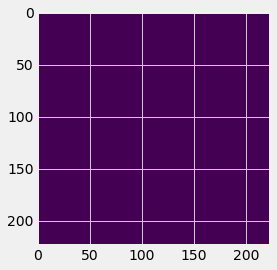

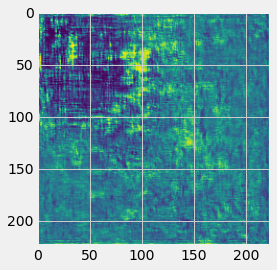

In [ ]:
for i in range(20):
  plt.imshow(x_test[i])
  plt.show()
  plt.imshow(np.squeeze(y_test[i]))
  plt.show()
  plt.imshow(np.squeeze(predictions[i]))
  plt.show()

### Jaccard loss: -12.78, IOU score 1.49, lr = 0.0000001, batch size = 1

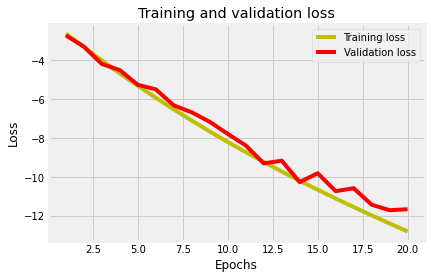

In [ ]:
#accuracy = model.evaluate(x_val, y_val)
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
predictions = model.predict(x_test)

In [ ]:
for i in range(20):
  plt.imshow(x_test[i])
  plt.show()
  plt.imshow(np.squeeze(y_test[i]))
  plt.show()
  plt.imshow(np.squeeze(predictions[i]))
  plt.show()

### Jaccard loss = - 0.52, lr = 0.000000001, batch size = 1

In [ ]:
for i in range(20):
  plt.imshow(x_test[i])
  plt.show()
  plt.imshow(np.squeeze(y_test[i]))
  plt.show()
  plt.imshow(np.squeeze(predictions[i]))
  plt.show()

## Predict given image

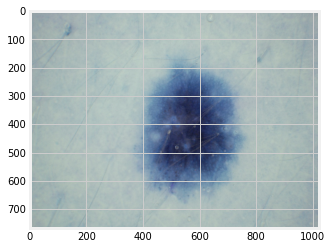

In [ ]:
img = cv2.imread('data/Validation_Input/ISIC_0012585.jpg')
plt.imshow(img)
plt.show()

In [ ]:
img_array = cv2.imread('data/Validation_Input/ISIC_0012585.jpg')
new_array = cv2.resize(img_array, (img_height, img_width))
final_img = new_array.reshape(-1, 224, 224, 3)
prediction = model.predict([final_img])
print(prediction)

[[[[1.]
   [1.]
   [1.]
   ...
   [1.]
   [1.]
   [1.]]

  [[1.]
   [1.]
   [1.]
   ...
   [1.]
   [1.]
   [1.]]

  [[1.]
   [1.]
   [1.]
   ...
   [1.]
   [1.]
   [1.]]

  ...

  [[1.]
   [1.]
   [1.]
   ...
   [1.]
   [1.]
   [1.]]

  [[1.]
   [1.]
   [1.]
   ...
   [1.]
   [1.]
   [1.]]

  [[1.]
   [1.]
   [1.]
   ...
   [1.]
   [1.]
   [1.]]]]


In [ ]:
count_zeros = 0
for i in prediction:
  for j in i:
    if j[0] == 0:
      count_zeros += 1
  
print(count_zeros)

0


In [ ]:
print(prediction.shape)

(1, 160, 160, 1)


In [ ]:
from PIL import Image

data = np.reshape(prediction, (160, 160))
img = Image.fromarray(data, '1')
img.save('test2.png')
img.show()

# Visualizations

## Evaluate convolutions

In [ ]:
model = tf.keras.models.load_model('Unet_iou_149.h5', compile = False)

In [ ]:
RSM = tf.keras.optimizers.RMSprop(
                            learning_rate=0.000005,
                            rho=0.9,
                            momentum=0.0,
                            epsilon=1e-07,
                            centered=False,
                            name="RMSprop")

model.compile(loss=sm.losses.bce_jaccard_loss,
               optimizer = RSM,
              metrics=[sm.metrics.iou_score])

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 block1_conv1 (Conv2D)          (None, None, None,   1792        ['input_1[0][0]']                
                                64)                                                               
                                                                                                  
 block1_conv2 (Conv2D)          (None, None, None,   36928       ['block1_conv1[0][0]']           
                                64)                                                           

In [ ]:
FIRST_IMAGE=0
SECOND_IMAGE=7
THIRD_IMAGE=5

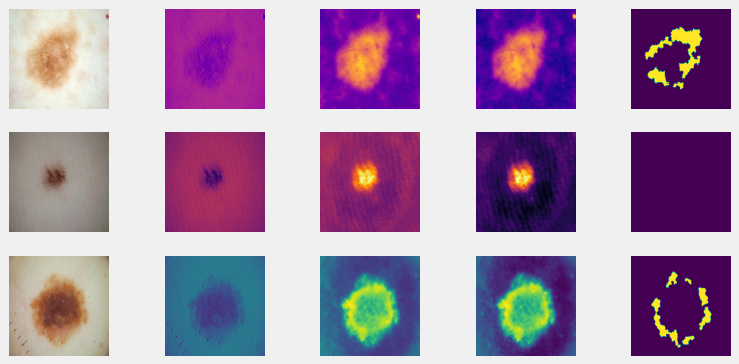

In [ ]:
#Let's vizualize what the CNN is doing with the images
f, axarr = plt.subplots(3,5, figsize=(12,6))

#Shows what each conv is doing
CONVOLUTION_NUMBER = 2

from tensorflow.keras import models
layer_outputs = [layer.output for layer in model.layers]
activation_model = tf.keras.models.Model(inputs = model.input, outputs = layer_outputs)
for x in range(1,4):
  f1 = activation_model.predict(x_test[FIRST_IMAGE].reshape(1, 224, 224, 3))[x]
  axarr[0,x].imshow(f1[0, : , :, CONVOLUTION_NUMBER], cmap='plasma')
  f2 = activation_model.predict(x_test[SECOND_IMAGE].reshape(1, 224, 224, 3))[x]
  axarr[1,x].imshow(f2[0, : , :, CONVOLUTION_NUMBER], cmap='inferno')
  f3 = activation_model.predict(x_test[THIRD_IMAGE].reshape(1, 224, 224, 3))[x]
  axarr[2,x].imshow(f3[0, : , :, CONVOLUTION_NUMBER], cmap='viridis')

axarr[0,0].imshow(x_test[FIRST_IMAGE])
axarr[1,0].imshow(x_test[SECOND_IMAGE])
axarr[2,0].imshow(x_test[THIRD_IMAGE])


axarr[0,4].imshow(np.squeeze(y_test[FIRST_IMAGE]))
axarr[1,4].imshow(np.squeeze(y_test[SECOND_IMAGE]))
axarr[2,4].imshow(np.squeeze(y_test[THIRD_IMAGE]))


for i in range(0, 3):
  for j in range(0, 5):
    axarr[i, j].grid(False)
    axarr[i ,j].axes.get_yaxis().set_visible(False)
    axarr[i ,j].axes.get_xaxis().set_visible(False)

plt.show()

##  Overlap mask and images

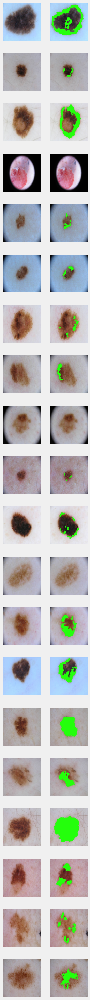

In [ ]:
# Load image as array

input_dir = 'data/Training_Input/'
pigment_dir = 'data/Training_GroundTruth/pigment_network/'

f, axarr = plt.subplots(20,2, figsize=(4, 50))

for i in range(20):
  input = cv2.imread(input_dir + sorted(os.listdir(input_dir))[i])
  input = cv2.resize(input, (1000, 1000))
  input = cv2.cvtColor(input, cv2.COLOR_BGR2RGB)
  axarr[i,0].imshow(np.squeeze(input))

  pigment = cv2.imread(pigment_dir + sorted(os.listdir(pigment_dir))[i], 0)
  pigment = cv2.resize(pigment, (1000, 1000))
  pigment = cv2.threshold(pigment, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

  input[pigment==255] = (36,255,12)
  axarr[i,1].imshow(np.squeeze(input))

for i in range(0, 20):
  for j in range(0, 2):
    axarr[i, j].grid(False)
    axarr[i ,j].axes.get_yaxis().set_visible(False)
    axarr[i ,j].axes.get_xaxis().set_visible(False)

plt.show()

In [ ]:
for i in range(20):
  input = cv2.imread(input_dir + sorted(os.listdir(input_dir))[i])
  input = cv2.resize(input, (1000, 1000))
  input = cv2.cvtColor(input, cv2.COLOR_BGR2RGB)

  pigment = cv2.imread(pigment_dir + sorted(os.listdir(pigment_dir))[i])
  pigment = cv2.resize(pigment, (1000, 1000))

  output = cv2.addWeighted(pigment,0.1,input,0.7,0)

  plt.figure(figsize=(12,6))
  plt.grid(False)
  plt.imshow(np.squeeze(output))
  plt.show()

Different colors along the lesion, 'geologic shape', descamativo, and bleeding